In [ ]:
!pip install ultralytics

In [ ]:
from ultralytics import YOLO

In [ ]:
model = YOLO("yolo11l-seg.pt")

In [ ]:
!pip install roboflow


In [ ]:
#import
from roboflow import Roboflow
rf = Roboflow(api_key="wGlZ3vOrEX0zIGqbJUr0")
project = rf.workspace("yolo-zad4").project("micesegmentation")
version = project.version(2)
dataset = version.download("yolov11")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to micesegmentation-2 in yolov11:: 100%|██████████| 576/576 [00:00<00:00, 925.59it/s]


In [ ]:
dataFolfer = "/content/micesegmentation-2/"

#Обучение и результаты

In [ ]:
results = model.train(data=dataFolfer+'data.yaml', epochs=10, imgsz=640)

Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/micesegmentation-2/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11l-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.

100%|██████████| 755k/755k [00:00<00:00, 19.9MB/s]

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  2    173824  ultralytics.nn.modules.block.C3k2            [128, 256, 2, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  2    691712  ultralytics.nn.modules.block.C3k2            [256, 512, 2, True, 0.25]     


  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  2   2234368  ultralytics.nn.modules.block.C3k2            [512, 512, 2, True]           
  7                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  8                  -1  2   2234368  ultralytics.nn.modules.block.C3k2            [512, 512, 2, True]           
  9                  -1  1    656896  ultralytics.nn.modules.block.SPPF            [512, 512, 5]                 
 10                  -1  2   1455616  ultralytics.nn.modules.block.C2PSA           [512, 512, 2]                 
 11                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 12             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 13                  -1  2   2496512  ultralytics.nn.modules.block.C3k2            [1024

100%|██████████| 5.35M/5.35M [00:00<00:00, 98.5MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1598.2±932.3 MB/s, size: 88.1 KB)


train: Scanning /content/micesegmentation-2/train/labels... 249 images, 0 backgrounds, 0 corrupt: 100%|██████████| 249/249 [00:00<00:00, 2220.78it/s]

train: New cache created: /content/micesegmentation-2/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1076.5±688.8 MB/s, size: 66.2 KB)


val: Scanning /content/micesegmentation-2/valid/labels... 22 images, 0 backgrounds, 0 corrupt: 100%|██████████| 22/22 [00:00<00:00, 1223.85it/s]

val: New cache created: /content/micesegmentation-2/valid/labels.cache


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 176 weight(decay=0.0), 187 weight(decay=0.0005), 186 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/10      11.5G      1.919        3.2      4.649      2.164         10        640: 100%|██████████| 16/16 [00:18<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

                   all         22         24     0.0956      0.344     0.0711     0.0165      0.116      0.417     0.0772     0.0195



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/10      11.7G      1.786      1.597      3.388      1.924          9        640: 100%|██████████| 16/16 [00:14<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

                   all         22         24   0.000357     0.0833   0.000248   8.49e-05          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/10      11.8G      1.836      1.276      2.479      2.083         10        640: 100%|██████████| 16/16 [00:14<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

                   all         22         24          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/10      11.8G      1.789      1.218      2.168      2.002         14        640: 100%|██████████| 16/16 [00:14<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all         22         24          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/10      11.8G      1.795      1.154      1.886      2.084         11        640: 100%|██████████| 16/16 [00:14<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all         22         24          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/10      11.8G      1.582      1.025      1.712       1.95         10        640: 100%|██████████| 16/16 [00:14<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

                   all         22         24          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/10      11.8G      1.437     0.9313      1.657      1.818          9        640: 100%|██████████| 16/16 [00:14<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

                   all         22         24          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/10      11.8G      1.393     0.8663      1.489      1.767          9        640: 100%|██████████| 16/16 [00:13<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         22         24    0.00515      0.625     0.0186    0.00336   0.000343     0.0417   0.000825   0.000318



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/10      11.8G      1.176     0.8449      1.271      1.554         11        640: 100%|██████████| 16/16 [00:13<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         22         24     0.0758     0.0833     0.0171    0.00458     0.0522     0.0833     0.0114    0.00284



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/10      11.8G       1.11      0.733      1.171      1.526          9        640: 100%|██████████| 16/16 [00:14<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         22         24      0.778      0.731      0.735      0.443      0.866      0.807      0.851      0.614



10 epochs completed in 0.046 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 55.8MB
Optimizer stripped from runs/segment/train/weights/best.pt, 55.8MB

Validating runs/segment/train/weights/best.pt...
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11l-seg summary (fused): 203 layers, 27,585,363 parameters, 0 gradients, 141.9 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


                   all         22         24      0.778       0.73      0.735      0.444      0.866      0.805      0.851      0.614
Speed: 0.2ms preprocess, 20.1ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/segment/train


In [ ]:
from pprint import pprint


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

dataFr = pd.read_csv('/content/runs/segment/train/results.csv') # файл с результатами обучения

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


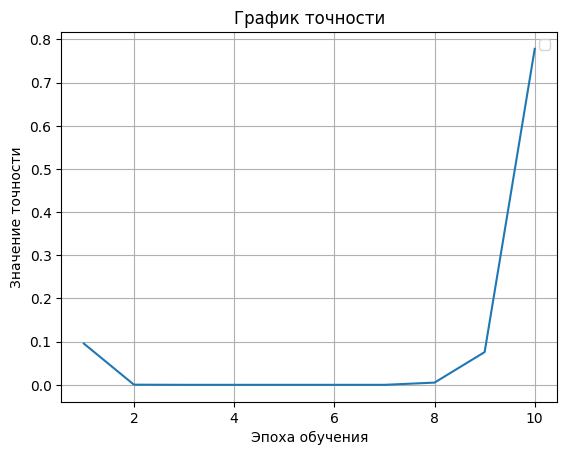

In [ ]:
plt.title("График точности")
plt.plot(dataFr["epoch"], dataFr["metrics/precision(B)"])
plt.xlabel("Эпоха обучения")
plt.ylabel("Значение точности")
plt.legend()
plt.grid()
plt.show()

#Сегментация на тестовых картинках из датасета

In [ ]:
from os import listdir
from os.path import isfile, join


In [ ]:
mypath = dataFolfer+'test/images'
files = [f for f in listdir(mypath)][:10]
for i in range(len(files)):
  k = files[i].rfind('.')
  files[i] = files[i][0:k]

filesJPG = [f + '.jpg' for f in files]
print(filesJPG)
onlyfiles = [join(mypath, f) for f in filesJPG]

onlyfiles

resultsTest = model(onlyfiles)

['ch16_20221229153446_20221229163446_-070830_bmp.rf.dc7e5f9d763aa936d5d839544eb4941e.jpg', 'ch16_20221229163446_20221229173446_-003518_bmp.rf.9c09b2c0229738834f27f67efe731116.jpg', 'ch16_20221229163446_20221229173446_-005185_bmp.rf.51e524832dc72646d28e377a99a24ab1.jpg', 'ch16_20221229163446_20221229173446_-009629_bmp.rf.5f55d095f255822fa78ad87747620514.jpg', 'ch16_20221229163446_20221229173446_-022684_bmp.rf.77db149f6c3049bbb99a5ca8ee4952d0.jpg', 'ch16_20221229153446_20221229163446_-083978_bmp.rf.8b1316fae5360c4147cc47ad9c4d0391.jpg', 'ch16_20221229163446_20221229173446_-004166_bmp.rf.9793f75bcb5442682361ee3a40e70003.jpg', 'ch16_20221229153446_20221229163446_-084719_bmp.rf.f299295862a4e50b275f92b8c66b06d5.jpg', 'ch16_20221229153446_20221229163446_-085460_bmp.rf.a566ffb831986e9151cfbdd1f8e517c4.jpg', 'ch16_20221229153446_20221229163446_-067034_bmp.rf.06e6329c5460598a0b1997d777623eb5.jpg']

0: 640x640 1 mice, 39.7ms
1: 640x640 4 mices, 39.7ms
2: 640x640 4 mices, 39.7ms
3: 640x640 2 mices

In [ ]:
mypath = dataFolfer+'test/labels'
filesTXT = [f + '.txt' for f in files]
print(filesTXT)
onlyfilesLabels = [join(mypath, f) for f in filesTXT]

['ch16_20221229153446_20221229163446_-070830_bmp.rf.dc7e5f9d763aa936d5d839544eb4941e.txt', 'ch16_20221229163446_20221229173446_-003518_bmp.rf.9c09b2c0229738834f27f67efe731116.txt', 'ch16_20221229163446_20221229173446_-005185_bmp.rf.51e524832dc72646d28e377a99a24ab1.txt', 'ch16_20221229163446_20221229173446_-009629_bmp.rf.5f55d095f255822fa78ad87747620514.txt', 'ch16_20221229163446_20221229173446_-022684_bmp.rf.77db149f6c3049bbb99a5ca8ee4952d0.txt', 'ch16_20221229153446_20221229163446_-083978_bmp.rf.8b1316fae5360c4147cc47ad9c4d0391.txt', 'ch16_20221229163446_20221229173446_-004166_bmp.rf.9793f75bcb5442682361ee3a40e70003.txt', 'ch16_20221229153446_20221229163446_-084719_bmp.rf.f299295862a4e50b275f92b8c66b06d5.txt', 'ch16_20221229153446_20221229163446_-085460_bmp.rf.a566ffb831986e9151cfbdd1f8e517c4.txt', 'ch16_20221229153446_20221229163446_-067034_bmp.rf.06e6329c5460598a0b1997d777623eb5.txt']


In [ ]:
dictSymbols={0: 'mice'}

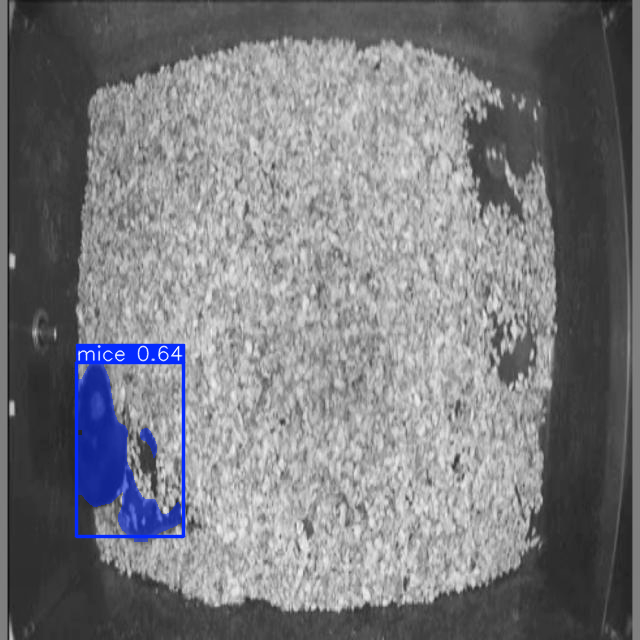

actual:  mice


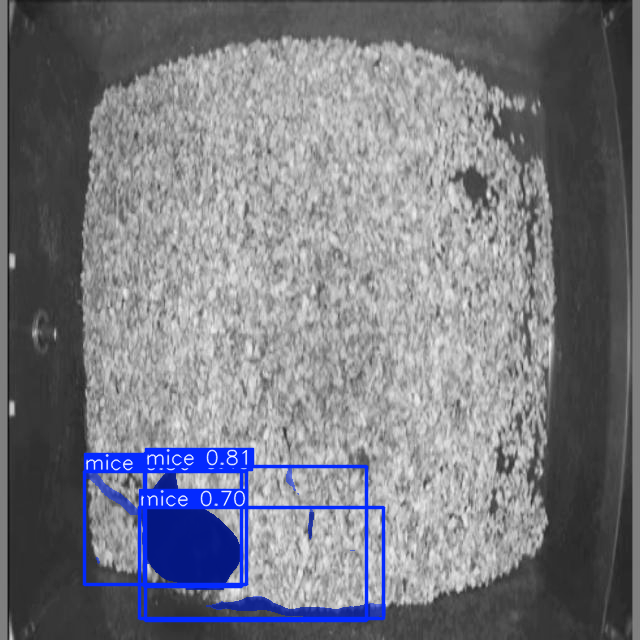

actual:  mice


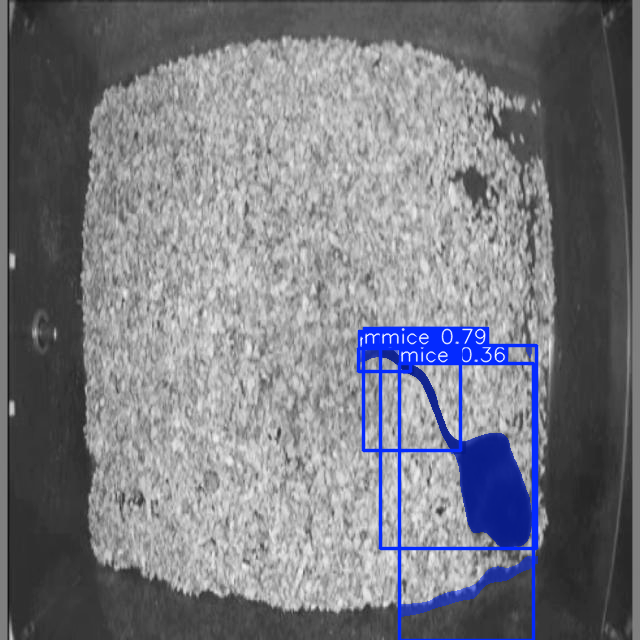

actual:  mice


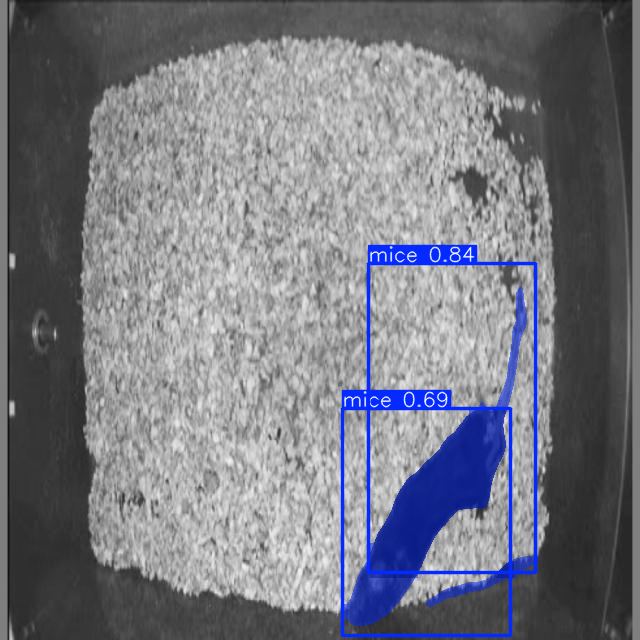

actual:  mice


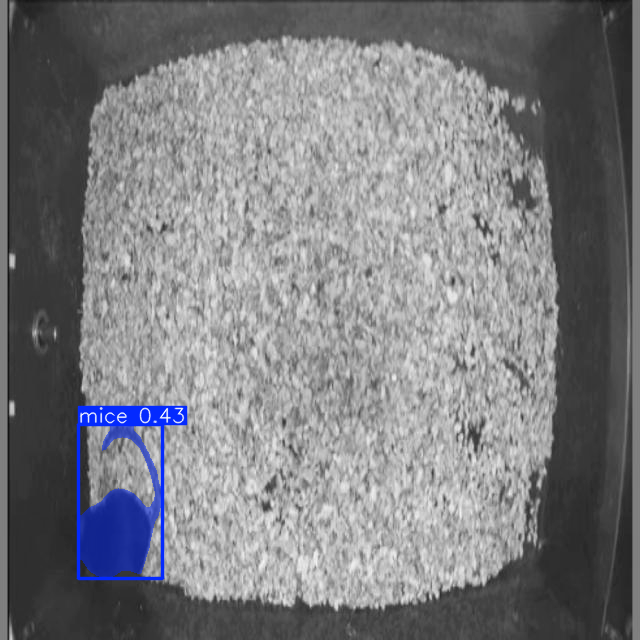

actual:  mice


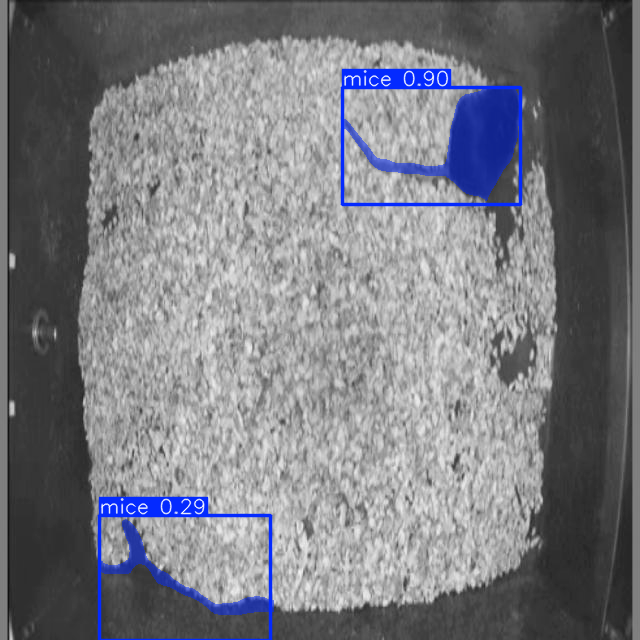

actual:  mice


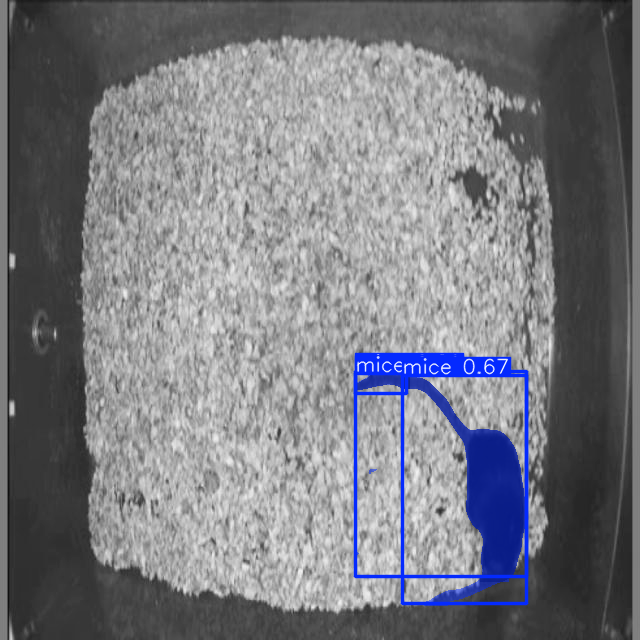

actual:  mice


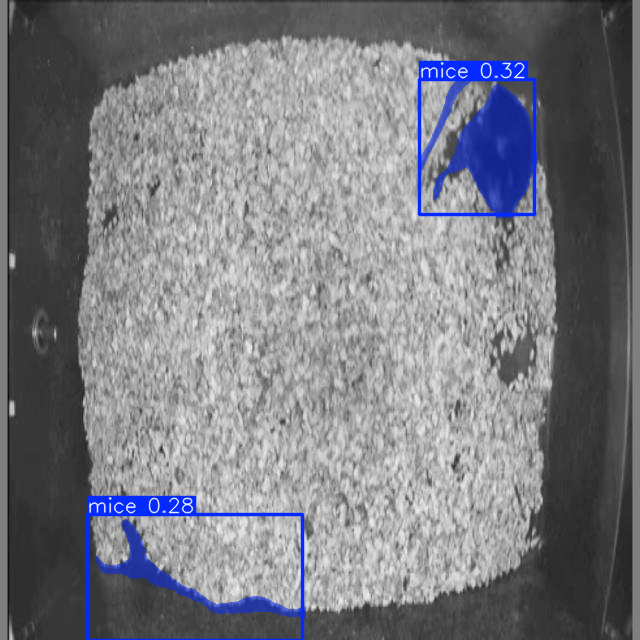

actual:  mice


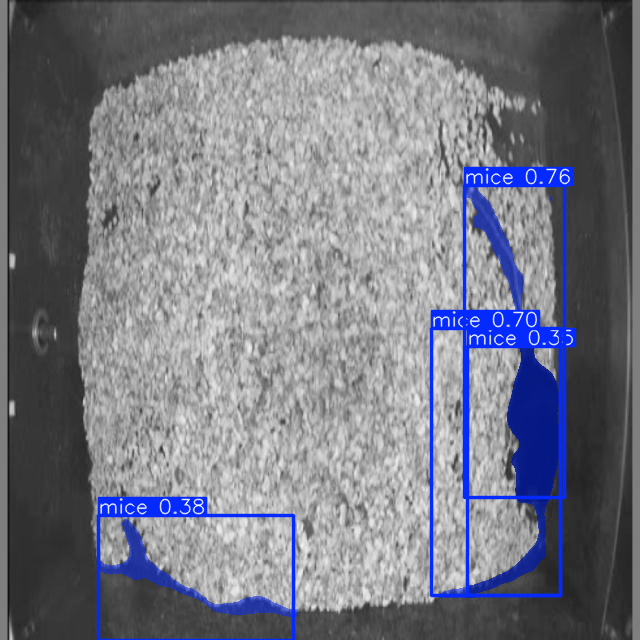

actual:  mice


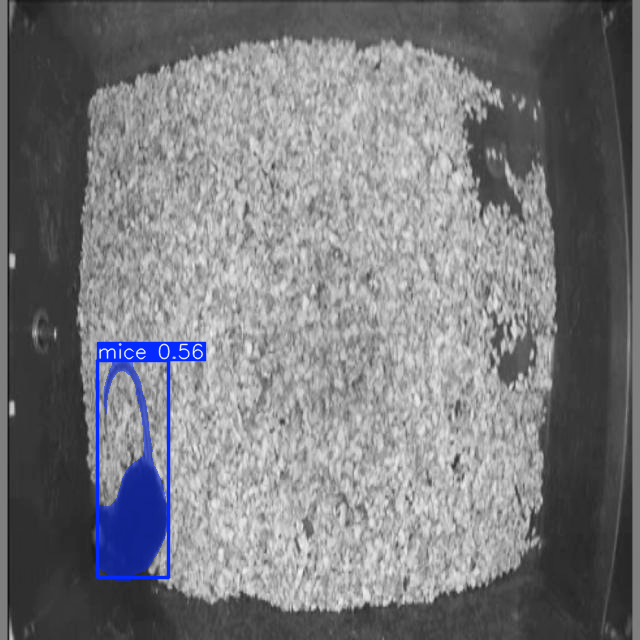

actual:  mice


In [ ]:
k=0
for item in resultsTest:
  item.show()
  with open(onlyfilesLabels[k],'r') as f:
    print('actual: ',dictSymbols[int(f.read().split()[0])])
  # print(onlyfiles[k])
  k+=1


#Сегментация на картинках не из датасета


image 1/1 /content/ch11_20230523180211_20230523190211@065986.bmp: 384x640 1 mice, 63.9ms
Speed: 4.6ms preprocess, 63.9ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


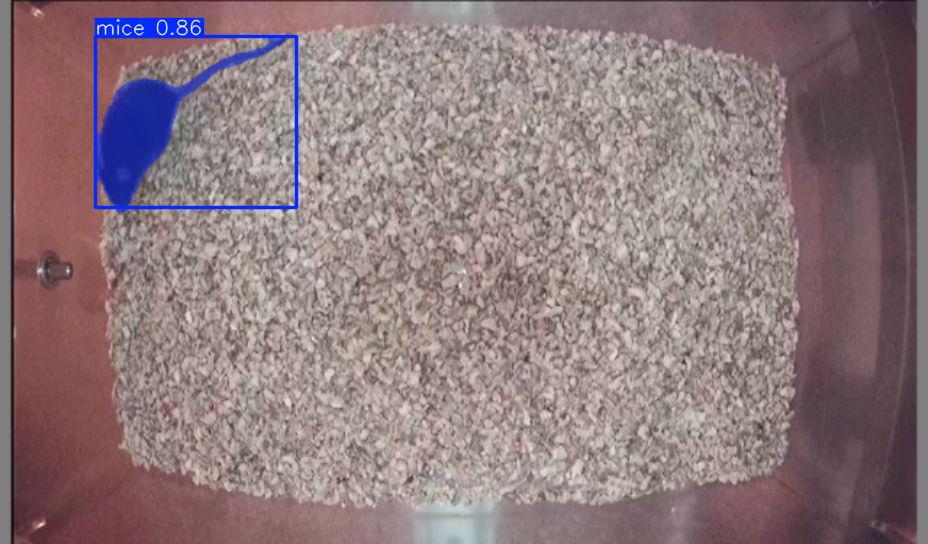

In [ ]:
resultIm = model('/content/ch11_20230523180211_20230523190211@065986.bmp')
for item in resultIm:
  item.show()


image 1/1 /content/ch12_20221228193446_20221228203446@096083.bmp: 384x640 1 mice, 39.7ms
Speed: 2.5ms preprocess, 39.7ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)


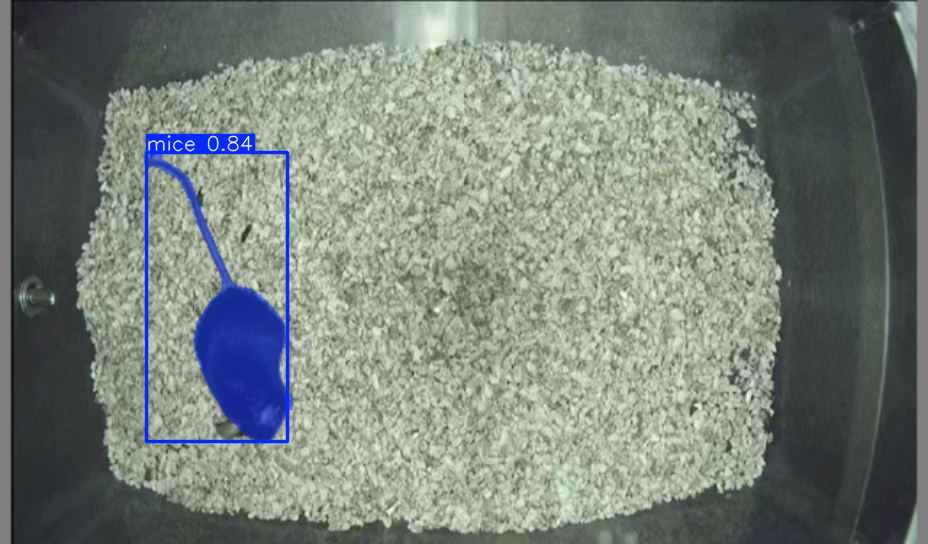

In [ ]:
resultIm = model('/content/ch12_20221228193446_20221228203446@096083.bmp')
for item in resultIm:
  item.show()

Модель правильно нашла всех мышей на фото, хотя на некоторых изображениях, просвечивающий пол клетки тоже считался за мышь

если увеличить количество эпох обучения или тренировочный датасет, проблема должна решиться


#Обучение модели с бОльшим количеством эпох

In [ ]:
results = model.train(data=dataFolfer+'data.yaml', epochs=16, imgsz=640)

Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/micesegmentation-2/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=16, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11l-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.

100%|██████████| 755k/755k [00:00<00:00, 19.5MB/s]

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               


  2                  -1  2    173824  ultralytics.nn.modules.block.C3k2            [128, 256, 2, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  2    691712  ultralytics.nn.modules.block.C3k2            [256, 512, 2, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  2   2234368  ultralytics.nn.modules.block.C3k2            [512, 512, 2, True]           
  7                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  8                  -1  2   2234368  ultralytics.nn.modules.block.C3k2            [512, 512, 2, True]           
  9                  -1  1    656896  ultralytics.nn.modules.block.SPPF            [512, 512, 5]                 
 10                  -1  2   1455616  ultralytics.nn.modules.block.C2PSA           [512,

100%|██████████| 5.35M/5.35M [00:00<00:00, 68.9MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1291.1±993.4 MB/s, size: 88.1 KB)


train: Scanning /content/micesegmentation-2/train/labels... 249 images, 0 backgrounds, 0 corrupt: 100%|██████████| 249/249 [00:00<00:00, 2030.10it/s]

train: New cache created: /content/micesegmentation-2/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 958.4±642.2 MB/s, size: 66.2 KB)


val: Scanning /content/micesegmentation-2/valid/labels... 22 images, 0 backgrounds, 0 corrupt: 100%|██████████| 22/22 [00:00<00:00, 1069.13it/s]

val: New cache created: /content/micesegmentation-2/valid/labels.cache


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 176 weight(decay=0.0), 187 weight(decay=0.0005), 186 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/train
Starting training for 16 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/16      11.6G      1.796      3.238      3.861      1.935         18        640: 100%|██████████| 16/16 [00:17<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

                   all         22         24     0.0366      0.125     0.0199    0.00468     0.0338      0.125     0.0111    0.00236



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/16      11.8G      1.407      1.407      2.242      1.575         11        640: 100%|██████████| 16/16 [00:14<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all         22         24    0.00152      0.417    0.00122   0.000313   0.000909       0.25   0.000758   0.000262



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/16      11.8G      1.617      1.533      1.947      1.713         19        640: 100%|██████████| 16/16 [00:15<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

                   all         22         24          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/16      11.8G      1.614      1.237      1.888      1.679         14        640: 100%|██████████| 16/16 [00:14<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

                   all         22         24          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/16      11.9G      1.496      1.222      1.707      1.613         13        640: 100%|██████████| 16/16 [00:14<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all         22         24          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/16      11.9G      1.433      1.214      1.601      1.547         24        640: 100%|██████████| 16/16 [00:14<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

                   all         22         24          0          0          0          0          0          0          0          0


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/16      11.8G      1.693      1.144      1.841      2.059          9        640: 100%|██████████| 16/16 [00:15<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

                   all         22         24          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/16      11.8G      1.588     0.9663      1.605      1.961          9        640: 100%|██████████| 16/16 [00:14<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all         22         24          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/16      11.8G       1.51     0.9123      1.467      1.827         11        640: 100%|██████████| 16/16 [00:14<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

                   all         22         24    0.00164     0.0417   0.000747   0.000295          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/16      11.8G      1.345     0.9674      1.282       1.75          9        640: 100%|██████████| 16/16 [00:14<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

                   all         22         24      0.218      0.375       0.24      0.113       0.38      0.417        0.4      0.175



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/16      11.8G      1.366     0.8323      1.287      1.719         10        640: 100%|██████████| 16/16 [00:15<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

                   all         22         24      0.535        0.5      0.484      0.296      0.534      0.583      0.649      0.408



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/16      11.8G      1.139     0.7807      1.173       1.58         12        640: 100%|██████████| 16/16 [00:15<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

                   all         22         24      0.531      0.661      0.622      0.404      0.575      0.708      0.709      0.426



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/16      11.8G      1.194     0.8076      1.096      1.627         10        640: 100%|██████████| 16/16 [00:14<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

                   all         22         24      0.706      0.708      0.706      0.409      0.791      0.792      0.826      0.522



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/16      11.8G      1.093     0.8257     0.9802      1.503          9        640: 100%|██████████| 16/16 [00:14<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

                   all         22         24       0.72      0.751      0.777      0.526       0.87      0.792      0.887      0.629



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/16      11.8G          1     0.7366      0.979      1.452          9        640: 100%|██████████| 16/16 [00:15<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

                   all         22         24      0.799      0.792      0.809      0.516      0.891      0.875      0.893      0.678



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/16      11.8G     0.9207     0.6738     0.8654      1.383          9        640: 100%|██████████| 16/16 [00:15<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

                   all         22         24      0.812      0.792      0.813      0.593      0.899      0.875      0.894      0.679



16 epochs completed in 0.077 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 55.8MB
Optimizer stripped from runs/segment/train/weights/best.pt, 55.8MB

Validating runs/segment/train/weights/best.pt...
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11l-seg summary (fused): 203 layers, 27,585,363 parameters, 0 gradients, 141.9 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


                   all         22         24      0.812      0.792      0.813      0.593      0.899      0.875      0.893      0.678
Speed: 0.2ms preprocess, 20.7ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/segment/train


In [ ]:
from pprint import pprint


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

dataFr = pd.read_csv('/content/runs/segment/train/results.csv') # файл с результатами обучения

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


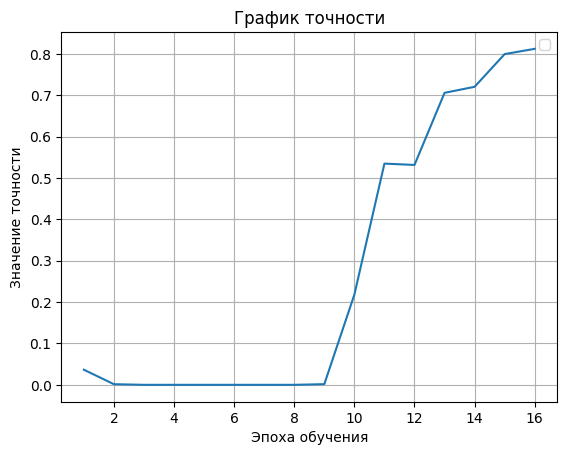

In [ ]:
plt.title("График точности")
plt.plot(dataFr["epoch"], dataFr["metrics/precision(B)"])
plt.xlabel("Эпоха обучения")
plt.ylabel("Значение точности")
plt.legend()
plt.grid()
plt.show()

#Сегментация 2 на тестовых картинках из датасета

In [ ]:
from os import listdir
from os.path import isfile, join


In [ ]:
mypath = dataFolfer+'test/images'
files = [f for f in listdir(mypath)][:10]
for i in range(len(files)):
  k = files[i].rfind('.')
  files[i] = files[i][0:k]

filesJPG = [f + '.jpg' for f in files]
print(filesJPG)
onlyfiles = [join(mypath, f) for f in filesJPG]

onlyfiles

resultsTest = model(onlyfiles)

['ch16_20221229153446_20221229163446_-070830_bmp.rf.dc7e5f9d763aa936d5d839544eb4941e.jpg', 'ch16_20221229163446_20221229173446_-003518_bmp.rf.9c09b2c0229738834f27f67efe731116.jpg', 'ch16_20221229163446_20221229173446_-005185_bmp.rf.51e524832dc72646d28e377a99a24ab1.jpg', 'ch16_20221229163446_20221229173446_-009629_bmp.rf.5f55d095f255822fa78ad87747620514.jpg', 'ch16_20221229163446_20221229173446_-022684_bmp.rf.77db149f6c3049bbb99a5ca8ee4952d0.jpg', 'ch16_20221229153446_20221229163446_-083978_bmp.rf.8b1316fae5360c4147cc47ad9c4d0391.jpg', 'ch16_20221229163446_20221229173446_-004166_bmp.rf.9793f75bcb5442682361ee3a40e70003.jpg', 'ch16_20221229153446_20221229163446_-084719_bmp.rf.f299295862a4e50b275f92b8c66b06d5.jpg', 'ch16_20221229153446_20221229163446_-085460_bmp.rf.a566ffb831986e9151cfbdd1f8e517c4.jpg', 'ch16_20221229153446_20221229163446_-067034_bmp.rf.06e6329c5460598a0b1997d777623eb5.jpg']

0: 640x640 2 mices, 40.2ms
1: 640x640 3 mices, 40.2ms
2: 640x640 2 mices, 40.2ms
3: 640x640 2 mice

In [ ]:
mypath = dataFolfer+'test/labels'
filesTXT = [f + '.txt' for f in files]
print(filesTXT)
onlyfilesLabels = [join(mypath, f) for f in filesTXT]

['ch16_20221229153446_20221229163446_-070830_bmp.rf.dc7e5f9d763aa936d5d839544eb4941e.txt', 'ch16_20221229163446_20221229173446_-003518_bmp.rf.9c09b2c0229738834f27f67efe731116.txt', 'ch16_20221229163446_20221229173446_-005185_bmp.rf.51e524832dc72646d28e377a99a24ab1.txt', 'ch16_20221229163446_20221229173446_-009629_bmp.rf.5f55d095f255822fa78ad87747620514.txt', 'ch16_20221229163446_20221229173446_-022684_bmp.rf.77db149f6c3049bbb99a5ca8ee4952d0.txt', 'ch16_20221229153446_20221229163446_-083978_bmp.rf.8b1316fae5360c4147cc47ad9c4d0391.txt', 'ch16_20221229163446_20221229173446_-004166_bmp.rf.9793f75bcb5442682361ee3a40e70003.txt', 'ch16_20221229153446_20221229163446_-084719_bmp.rf.f299295862a4e50b275f92b8c66b06d5.txt', 'ch16_20221229153446_20221229163446_-085460_bmp.rf.a566ffb831986e9151cfbdd1f8e517c4.txt', 'ch16_20221229153446_20221229163446_-067034_bmp.rf.06e6329c5460598a0b1997d777623eb5.txt']


In [ ]:
dictSymbols={0: 'mice'}

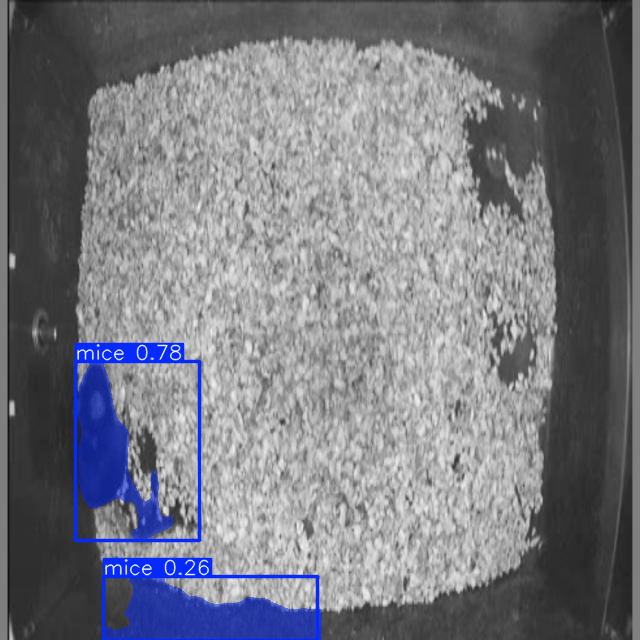

actual:  mice


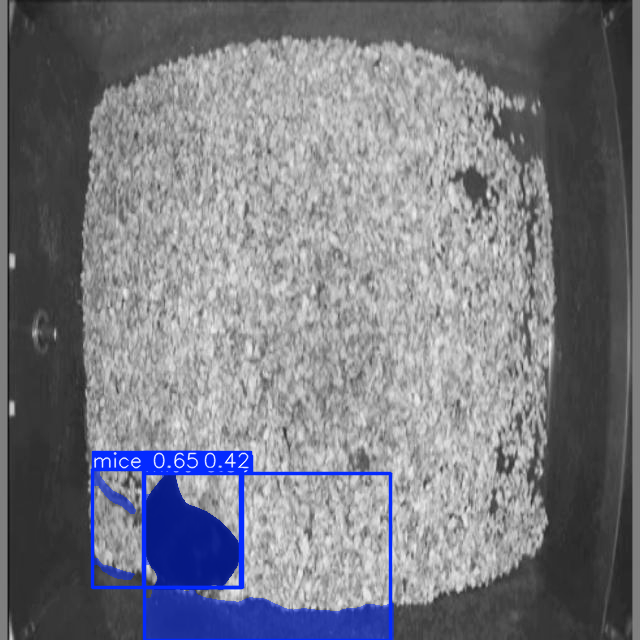

actual:  mice


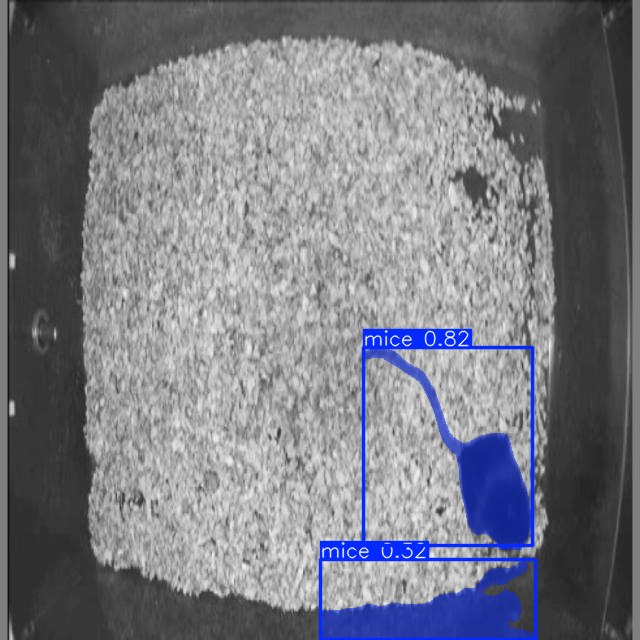

actual:  mice


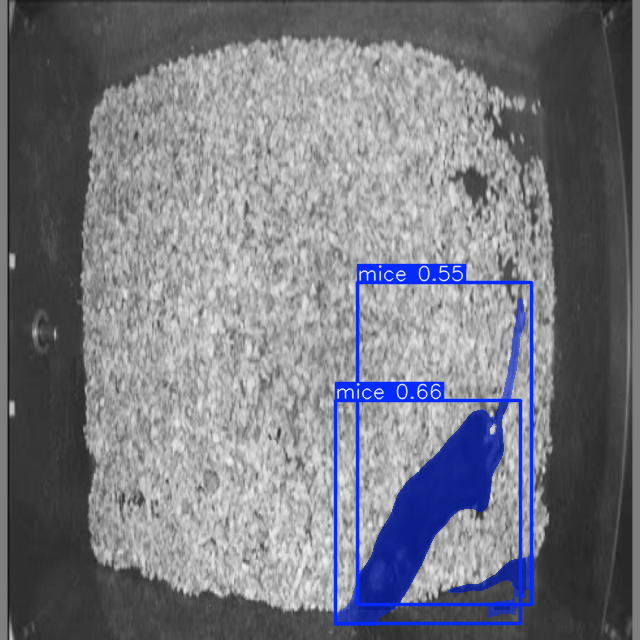

actual:  mice


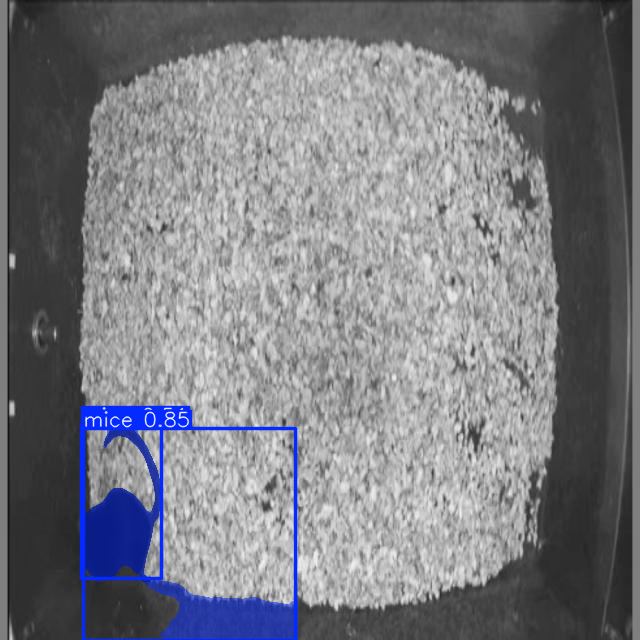

actual:  mice


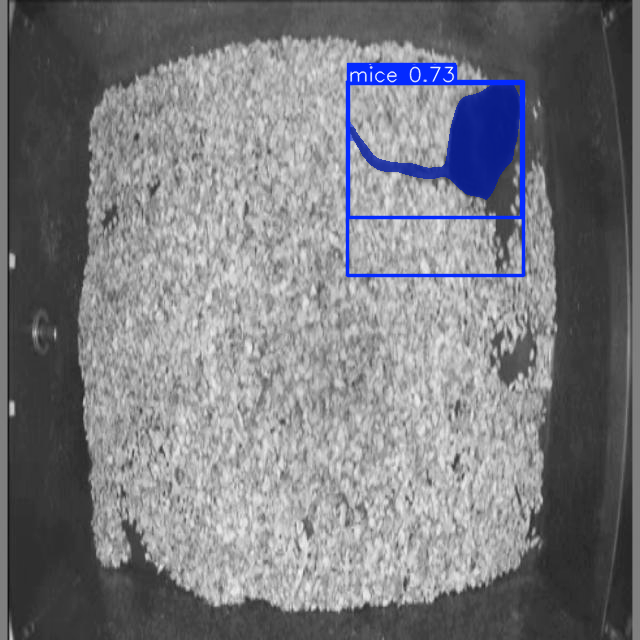

actual:  mice


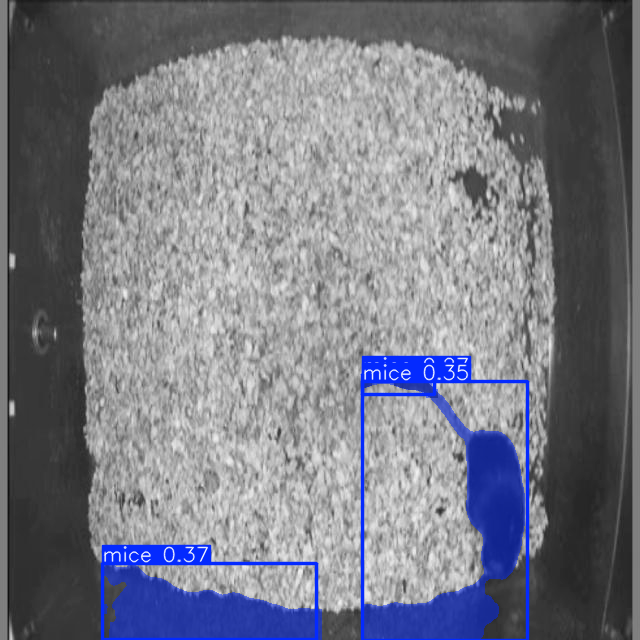

actual:  mice


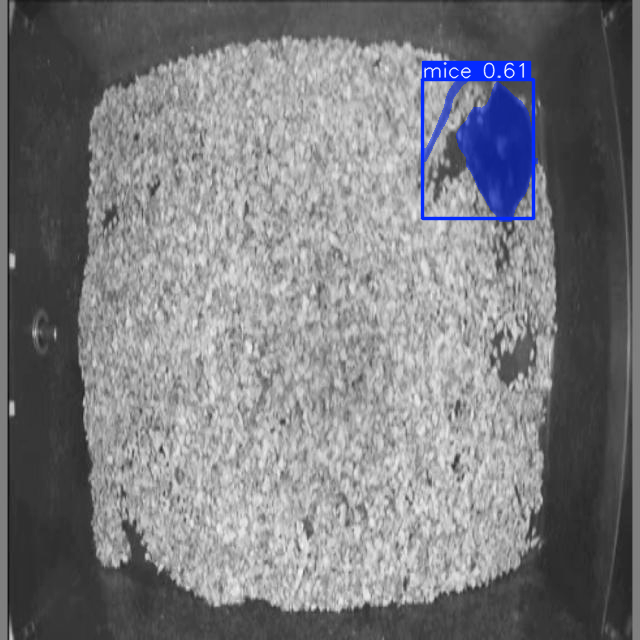

actual:  mice


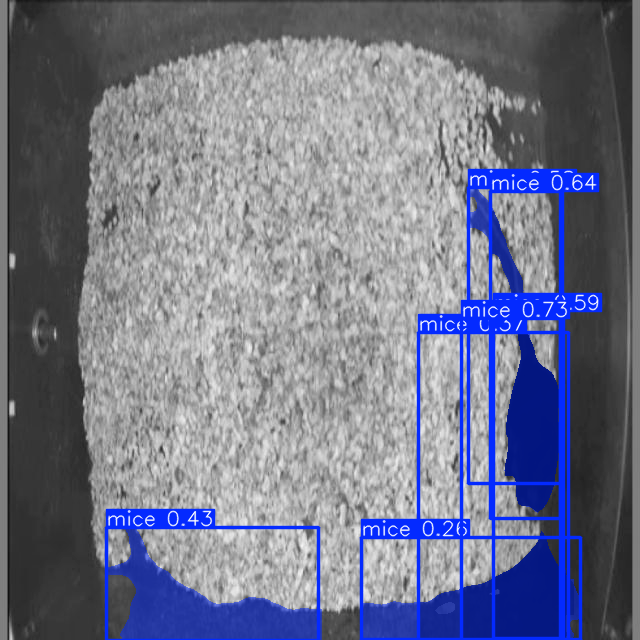

actual:  mice


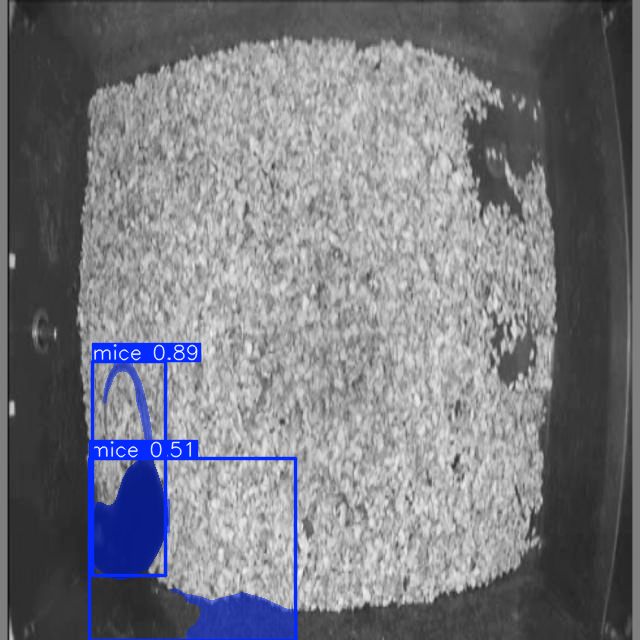

actual:  mice


In [ ]:
k=0
for item in resultsTest:
  item.show()
  with open(onlyfilesLabels[k],'r') as f:
    print('actual: ',dictSymbols[int(f.read().split()[0])])
  # print(onlyfiles[k])
  k+=1


#Сегментация 2 на картинках не из датасета


image 1/1 /content/ch11_20230523180211_20230523190211@065986.bmp: 384x640 1 mice, 64.8ms
Speed: 4.7ms preprocess, 64.8ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


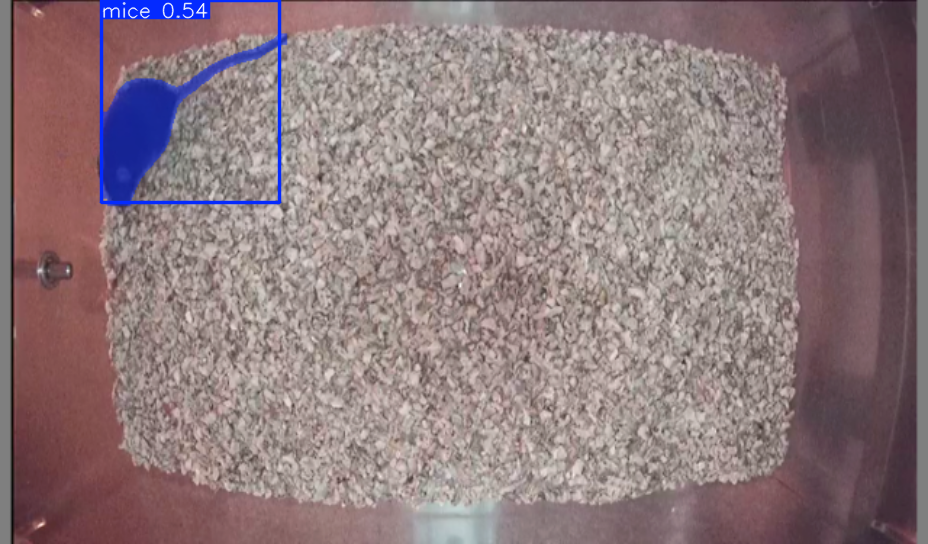

In [ ]:
resultIm = model('/content/ch11_20230523180211_20230523190211@065986.bmp')
for item in resultIm:
  item.show()


image 1/1 /content/ch12_20221228193446_20221228203446@096083.bmp: 384x640 1 mice, 39.7ms
Speed: 3.8ms preprocess, 39.7ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


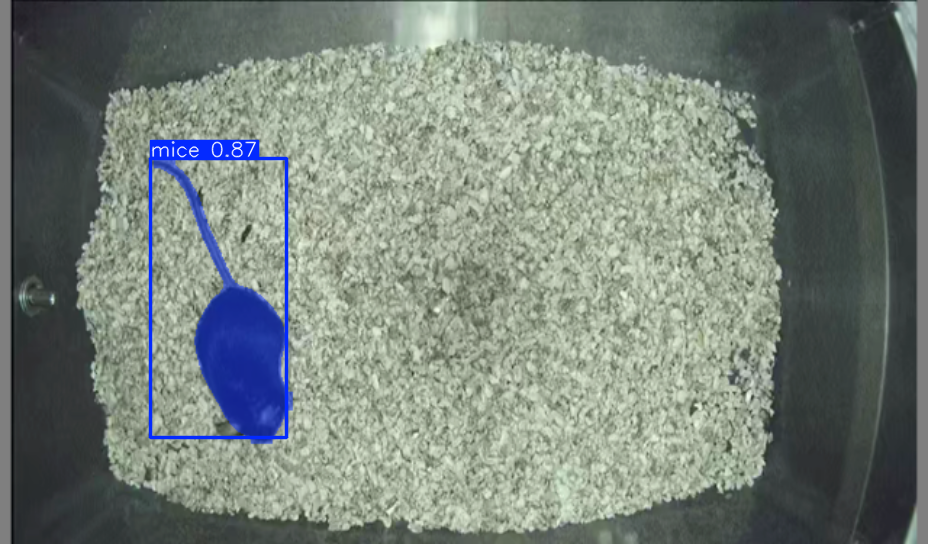

In [ ]:
resultIm = model('/content/ch12_20221228193446_20221228203446@096083.bmp')
for item in resultIm:
  item.show()

Модель правильно и более уверенно нашла всех мышей на фото и теперь двухвостых мышей на предсказанных картинках нет, однако теперь к просвечивающемуся полу так же добавиись темные стенки.

Таким образом решить проблему увеличением эпох не удалось
